# Strict CBF with Simple Nominal Policy Simulation

This notebook aims to create a simulation framework for the simpler control policy with a strict CBF applied to it that limits the robot's speed.

### Import relevant packages.

In [40]:
!pip install dynamaxsys

In [41]:
import abc
from typing import Callable
import matplotlib.pyplot as plt
import functools
import math

import jax
import jax.numpy as jnp
import numpy as np
import equinox as eqx

import cvxpy as cp
import dynamaxsys
from dynamaxsys.simplecar import DynamicallyExtendedSimpleCar

### Define parameters for the strict, simple control policy

In [42]:
WHEELBASE   = 1.0      # L
DT          = 0.05     # timestep (seconds)
MAX_STEPS   = 2000     # hard cutoff in case goal is never reached

# Nominal policy
V_DESIRED   = 1.6      # m/s cruise speed
K_V         = 2.0      # P-gain for speed controller
K_THETA     = 2.0      # P-gain for angular controller

# Goal location
GOAL_X = 1.0
GOAL_Y = 1.0

# CBF parameters
D_STOP      = 3.0      # distance at which v_max = 0
D_SLOW      = 10.0     # distance at which v_max = V_DESIRED (full speed allowed)
ALPHA       = 1.5      # CBF class-K gain (higher = more aggressive recovery)

# Control limits
A_MIN, A_MAX         = -5.0, 5.0
TAN_DELTA_MIN, TAN_DELTA_MAX = -0.8, 0.8

# Human positions (static for now — easy to make dynamic later)
HUMANS = np.array([
    [12.0,  1.5],
    [25.0, -2.0],
    [40.0,  0.5],
])

### Define robot and human dynamics

Using the dynamically extended simple car dynamics from the dynamaxsys package to represent a robot on wheels which is quite commonplace in a warehouse setting.

In [43]:
import dynamaxsys

wheelbase = 0.5     # in meters

robot = dynamaxsys.get_discrete_time_dynamics(DynamicallyExtendedSimpleCar(wheelbase=wheelbase), DT)  # robot dynamics
human = dynamaxsys.get_discrete_time_dynamics(DynamicallyExtendedSimpleCar(wheelbase=wheelbase), DT)  # human dynamics

### CBF helper functions

Define the maximum allowable velocity at certain radii away from the human obstacle in v_max() according to the diagram:

<img src="figures/strict_cbf_policy_visualization.png" width="40%">

In [44]:
# define maximum velocity based on proximity to human obstacle
def v_max(d):
    """Maximum velocity based on proximity to human obstacle."""
    if d <= D_STOP:
        return 0.0
    elif d <= D_SLOW:
        return 1/2 * V_DESIRED
    return V_DESIRED

# define derivative of v_max with respect to d to make robot slow down as it approaches the barrier of the velocity ranges
def dv_max_dd(d: float) -> float:
    """Derivative of v_max with respect to d."""
    if d <= D_STOP or d >= D_SLOW:
        return 0.0
    return V_DESIRED / (D_SLOW - D_STOP)

# function to compute the CBF constraint coefficients
def cbf_constraint_coeffs(state: np.ndarray, human_pos: np.ndarray):
    """
    Returns (lhs_a_coeff, rhs) such that the CBF condition is:
        lhs_a_coeff * a  >=  rhs

    The constraint is:  dh/dt + alpha*h >= 0
    where h = v_max(d) - v, dh/dt = dv_max_dd * d_dot - a

    lhs_a_coeff is always -1 (the constraint is:  -a + ... >= -alpha*h)
    rhs = -alpha*h - dv_max_dd * d_dot
    """
    px, py, theta, v = state
    phx, phy = human_pos

    diff = np.array([px - phx, py - phy])
    d = np.linalg.norm(diff)

    # Avoid division by zero
    if d < 1e-6:
        d = 1e-6

    h = v_max(d) - v

    # Time derivative of d:  d_dot = (diff / d) . [v cos(theta), v sin(theta)]
    vel_vec = np.array([v * math.cos(theta), v * math.sin(theta)])
    d_dot = (diff / d) @ vel_vec

    # dh/dt = dh_dt_free - a  (control enters only through 'a')
    # Condition: dh_dt_free - a + alpha * h >= 0
    # =>  -a >= -alpha*h - dh_dt_free
    # =>  a  <=  alpha*h + dh_dt_free          (rewrite as <=)
    upper_bound_on_a = ALPHA * h + dv_max_dd(d) * d_dot

    return upper_bound_on_a, h, d

### Define simple nominal control policy for robot, strict CBF policy

This policy defines a very simple nominal control policy (go in a straight line towards the goal) and does not try to steer to avoid obstacles. It simply adjusts the speed according to the CBF defined earlier and steers back on course if somehow the robot is not pointing along the nominal straight line path.

In [45]:
def cbf_control(state: np.ndarray, humans: np.ndarray) -> tuple[np.ndarray, list]:
    px, py, theta, v = state

    # 1. Determine proximity to the closest human
    min_d = float('inf')
    for h_pos in humans:
        diff = np.array([px - h_pos[0], py - h_pos[1]])
        d = np.linalg.norm(diff)
        if d < min_d:
            min_d = d

    # 2. Modify nominal acceleration to actively want to retreat if too close
    if min_d <= D_STOP:
        # Target the maximum reverse speed instead of V_DESIRED
        a_nom = K_V * (-1.0 - v)
    else:
        a_nom = K_V * (V_DESIRED - v)

    a_nom = float(np.clip(a_nom, A_MIN, A_MAX))

    # 3. Handle Angular Control (Steering)
    dx = GOAL_X - px
    dy = GOAL_Y - py
    desired_theta = math.atan2(dy, dx)
    heading_error = desired_theta - theta
    heading_error = (heading_error + math.pi) % (2 * math.pi) - math.pi

    # If moving backward, dial back nominal steering to avoid erratic oscillations
    if v < -0.1:
        tan_delta_nom = 0.0  # Keep wheels straight while backing up
    else:
        tan_delta_nom = K_THETA * heading_error

    # 4. Define nominal control vector and set up QP
    u_nom = np.array([tan_delta_nom, a_nom])
    u = cp.Variable(2)
    cost = cp.sum_squares(u - u_nom)

    constraints = [
        u[0] >= TAN_DELTA_MIN,
        u[0] <= TAN_DELTA_MAX,
        u[1] >= A_MIN,
        u[1] <= A_MAX,
    ]

    # 5. Add CBF constraints for each human
    diags = []
    for h_pos in humans:
        ub, h_val, d = cbf_constraint_coeffs(state, h_pos)
        constraints.append(u[1] <= ub)
        diags.append({"d": d, "h": h_val, "a_ub": ub})

    # Solves CBF-QP problem
    prob = cp.Problem(cp.Minimize(cost), constraints)
    prob.solve(solver=cp.CLARABEL, verbose=False)

    if prob.status not in ("optimal", "optimal_inaccurate"):
        # Fallback: full brakes / reverse gear instead of just stopping
        return np.array([0.0, A_MIN]), diags

    return u.value, diags

### Run simulation

Randomly place the robot on the left side of the factory floor and the goal on the right. Humans wander with random initial directions and bounce off the walls.

In [46]:
# --- World parameters ---
FLOOR_W = 80.0  # factory floor width  (m)
FLOOR_H = 40.0  # factory floor height (m)
N_HUMANS = 4
HUMAN_SPEED = 0.6  # m/s
GOAL_THRESHOLD = 0.5  # m — counts as reached
SEED = 7

np.random.seed(SEED)

# Robot: random start on the left third, heading = 0 (pointing right), v = 0
start_x = np.random.uniform(2.0, FLOOR_W / 3)
start_y = np.random.uniform(2.0, FLOOR_H - 2.0)
state = np.array([start_x, start_y, 0.0, 0.0])

# Goal: random position on the right third of the floor
GOAL_X = np.random.uniform(FLOOR_W * 2 / 3, FLOOR_W - 2.0)
GOAL_Y = np.random.uniform(2.0, FLOOR_H - 2.0)
goal = np.array([GOAL_X, GOAL_Y])

# Humans: random positions across the middle of the floor
human_pos = np.column_stack([
    np.random.uniform(FLOOR_W * 0.15, FLOOR_W * 0.85, N_HUMANS),
    np.random.uniform(2.0, FLOOR_H - 2.0, N_HUMANS),
])
human_angles = np.random.uniform(0, 2 * math.pi, N_HUMANS)
human_vel = np.column_stack([
    HUMAN_SPEED * np.cos(human_angles),
    HUMAN_SPEED * np.sin(human_angles),
])

# --- Storage ---
robot_traj = [state.copy()]  # list of [px, py, theta, v]
human_trajs = [human_pos.copy()]  # list of (N_HUMANS x 2) arrays

# --- Simulation loop ---
reached = False

for i in range(MAX_STEPS):
    # 1. Move humans (Euler, bounce off walls)
    human_pos = human_pos + human_vel * DT
    for j in range(N_HUMANS):
        if human_pos[j, 0] < 0 or human_pos[j, 0] > FLOOR_W:
            human_vel[j, 0] *= -1
        if human_pos[j, 1] < 0 or human_pos[j, 1] > FLOOR_H:
            human_vel[j, 1] *= -1
    human_pos = np.clip(human_pos, [0, 0], [FLOOR_W, FLOOR_H])

    # 2. Compute CBF-filtered control
    u, diags = cbf_control(state, human_pos)

    # 3. Step robot dynamics (RK4 via dynamaxsys)
    state = np.array(robot(jnp.array(state), jnp.array(u)))

    robot_traj.append(state.copy())
    human_trajs.append(human_pos.copy())

    # 4. Check goal
    if np.linalg.norm(state[:2] - np.array([GOAL_X, GOAL_Y])) < GOAL_THRESHOLD:
        print(f'Goal reached at step {i + 1},  t = {(i + 1) * DT:.1f} s')
        reached = True
        break

if not reached:
    print(f'Max steps reached ({MAX_STEPS}) steps without reaching the goal.')

robot_traj = np.array(robot_traj)  # shape: (T, 4)
human_trajs = np.array(human_trajs)  # shape: (T, N_HUMANS, 2)


Goal reached at step 1501,  t = 75.0 s


### Visualize

Two plots: the full trajectory on the factory floor, and the robot speed over time.

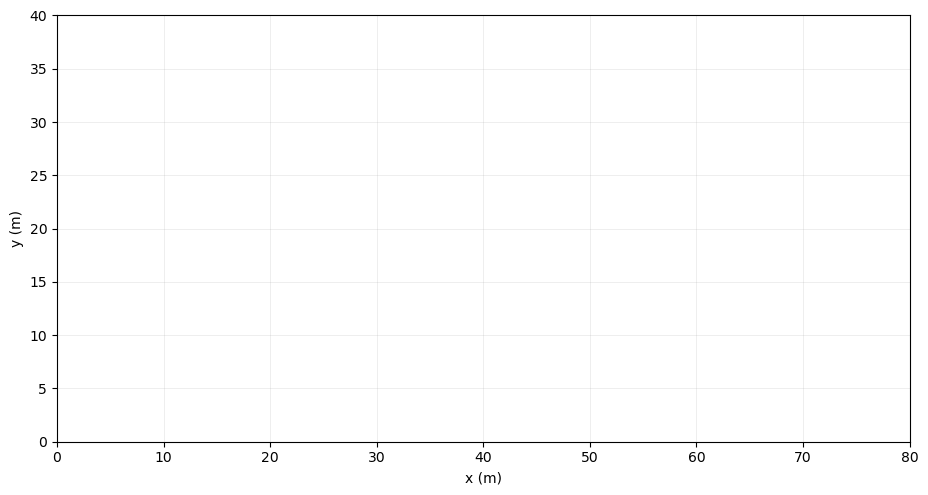

In [47]:
import matplotlib.animation as animation
from IPython.display import HTML

ROBOT_BODY_R = 0.8   # robot body radius for display (m)
HUMAN_BODY_R = 0.5   # human body radius for display (m)
ANIM_EVERY = 10

fig, ax = plt.subplots(figsize=(11, 7))

def init():
    ax.clear()
    ax.set_xlim([0, FLOOR_W])
    ax.set_ylim([0, FLOOR_H])
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    ax.set_xlabel('x (m)')
    ax.set_ylabel('y (m)')
    return []

def animate(i):
    ax.clear()
    ax.set_xlim([0, FLOOR_W])
    ax.set_ylim([0, FLOOR_H])
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    ax.set_xlabel('x (m)')
    ax.set_ylabel('y (m)')

    # --- goal ---
    ax.plot(GOAL_X, GOAL_Y, marker='*', ms=16, color='green', zorder=10, label='Goal')
    ax.add_patch(plt.Circle((GOAL_X, GOAL_Y), GOAL_THRESHOLD, color='green', alpha=0.2))

    # --- CBF zones + human trajectories + human bodies ---
    humans = human_trajs[i]
    for j in range(N_HUMANS):
        hx, hy = humans[j]
        ax.add_patch(plt.Circle((hx, hy), D_SLOW, color='C1', alpha=0.06, zorder=1))
        ax.add_patch(plt.Circle((hx, hy), D_STOP, color='C1', alpha=0.14, zorder=2))
        lbl_traj = 'Human Traj' if j == 0 else '_nolegend_'
        ax.plot(human_trajs[:i+1, j, 0], human_trajs[:i+1, j, 1],
                'o-', markersize=2, color='C1', alpha=0.35, label=lbl_traj)
        ax.add_patch(plt.Circle((hx, hy), HUMAN_BODY_R, color='C1', alpha=0.8, zorder=5))
        lbl_pt = 'Human' if j == 0 else '_nolegend_'
        ax.scatter([hx], [hy], s=20, color='C1', zorder=6, label=lbl_pt)

    # --- robot trajectory ---
    ax.plot(robot_traj[:i+1, 0], robot_traj[:i+1, 1],
            'o-', markersize=2, color='C0', alpha=0.5, label='Robot Traj')

    # --- robot body + heading arrow ---
    rx, ry, theta, v = robot_traj[i]
    ax.add_patch(plt.Circle((rx, ry), ROBOT_BODY_R, color='C0', alpha=0.75, zorder=7))
    ax.scatter([rx], [ry], s=20, color='C0', zorder=8, label='Robot')
    arrow_len = 2.0
    ax.annotate('',
        xy=(rx + arrow_len * math.cos(theta), ry + arrow_len * math.sin(theta)),
        xytext=(rx, ry),
        arrowprops=dict(arrowstyle='->', color='white', lw=2.0),
        zorder=9)

    ax.set_title(
        f't = {i*DT:.1f} s    '
        f'heading = {math.degrees(theta):.1f}°    '
        f'velocity = {v:.2f} m/s    '
        f'dist to goal = {np.linalg.norm(np.array([rx, ry]) - np.array([GOAL_X, GOAL_Y])):.1f} m'
    )
    ax.legend(loc='upper left', fontsize=8)

ani = animation.FuncAnimation(
    fig, animate,
    frames=range(0, len(robot_traj), ANIM_EVERY),
    init_func=init,
    interval=100,       # ms between frames (~10 fps)
    blit=False,
    repeat=True,
)

display(HTML(ani.to_jshtml()))
ani.save("cbf_simple_policy.gif", writer="pillow", fps=10)